In [5]:
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import PIL
from sklearn.cluster import KMeans
from PIL import Image,ImageEnhance





index = ["color", "color_name", "hex", "R", "G", "B"]
csv = pd.read_csv('colors.csv',encoding='utf-8', names=index, header=None)

In [6]:
# функция для нахождения самого близкого цвета
def get_color_name(R, G, B):
    minimum = 10000
    for i in range(len(csv)):
        d = abs(R - int(csv.loc[i, "R"])) + abs(G - int(csv.loc[i, "G"])) + abs(B - int(csv.loc[i, "B"]))
        if d <= minimum:
            minimum = d
            cname = csv.loc[i, "color_name"]
    return cname

In [7]:
def show_img_compar(img_1, img_2 ):
    f, ax = plt.subplots(1, 2, figsize=(20,20))
    ax[0].imshow(img_1)
    ax[1].imshow(img_2)
    ax[0].axis('off') #hide the axis
    ax[1].axis('off')
    f.tight_layout()
    plt.show()

In [8]:
def palette(clusters):
    width=1120
    palette = np.zeros((240, width, 3), np.uint8)
    steps = width/clusters.cluster_centers_.shape[0]
    for idx, centers in enumerate(clusters.cluster_centers_): 
        palette[:, int(idx*steps):(int((idx+1)*steps)), :] = centers
    
    
    return palette

In [9]:
def final(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    clt = KMeans(n_clusters=8)
    clt.fit(img.reshape(-1,3))
    a=clt.cluster_centers_
    color=[]
    for i,j,x in a: #алгоритм выыодит названия самых частых цветов!!!!!
        x=(get_color_name(i,j,x))
        print(x)
        color.append(x)
    print(color)
    
        
    clt_1 = clt.fit(img.reshape(-1, 3))
    show_img_compar(img, palette(clt_1))
    I=palette(clt_1)
    I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)
    I=cv2.resize(I,(600,120))
    aa = 'aa' + str(i) + '.png'
    cv2.imwrite(aa,I)#название файла,в которое сохраняется сама палитра. Каждое новое изображение надо менятт название
    


Железный 
Перламутровый серый 
Стальной 
Черный 
Оловянный 
Стальной 
Серо-Бежевый 
Бордовый
['Железный ', 'Перламутровый серый ', 'Стальной ', 'Черный ', 'Оловянный ', 'Стальной ', 'Серо-Бежевый ', 'Бордовый']


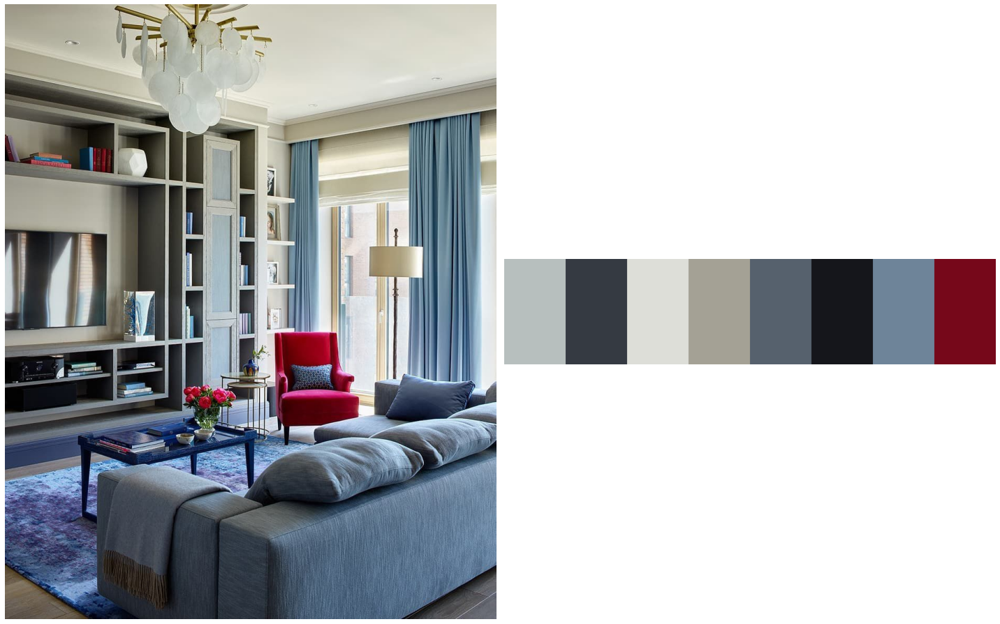

Каменый серый 
Железный 
Серо-Бежевый 
Сандаловый 
Черный 
Мраморный 
Серо-Бежевый 
Оловянный 
['Каменый серый ', 'Железный ', 'Серо-Бежевый ', 'Сандаловый ', 'Черный ', 'Мраморный ', 'Серо-Бежевый ', 'Оловянный ']


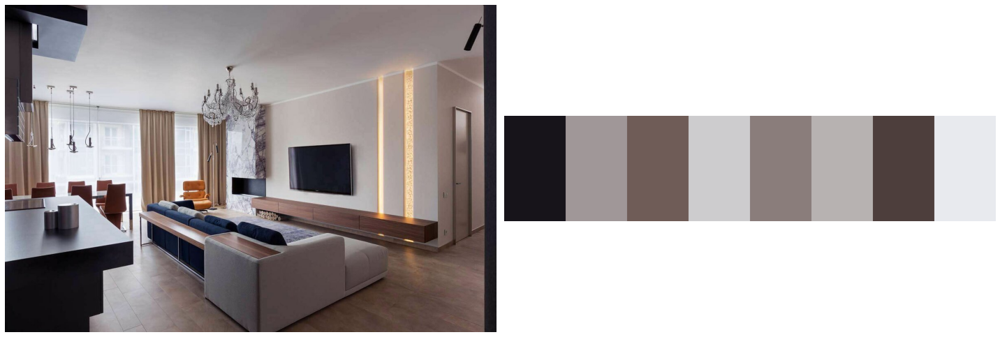

Сандаловый 
Коричнево-Бежевый 
Коричнево-Бежевый 
Соломенный
Оловянный 
Черный 
Кирпичный
Персиково-бежевый 
['Сандаловый ', 'Коричнево-Бежевый ', 'Коричнево-Бежевый ', 'Соломенный', 'Оловянный ', 'Черный ', 'Кирпичный', 'Персиково-бежевый ']


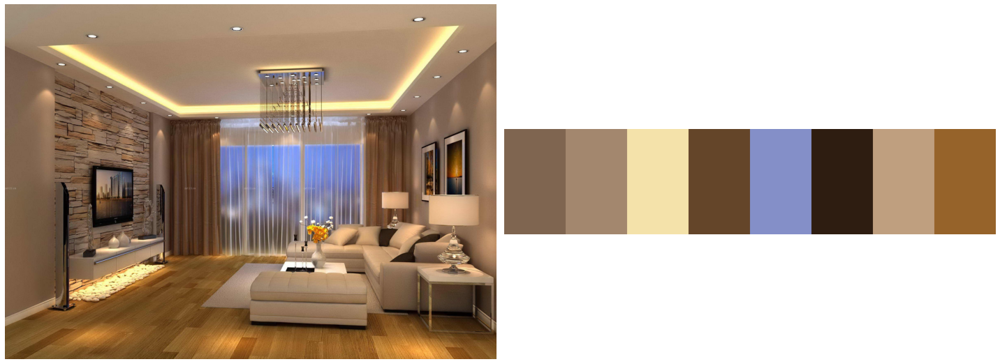

Каменый серый 
Серо-Бежевый 
Перламутровый серый 
Черный 
Оловянный 
Железный 
Мраморный 
Оловянный 
['Каменый серый ', 'Серо-Бежевый ', 'Перламутровый серый ', 'Черный ', 'Оловянный ', 'Железный ', 'Мраморный ', 'Оловянный ']


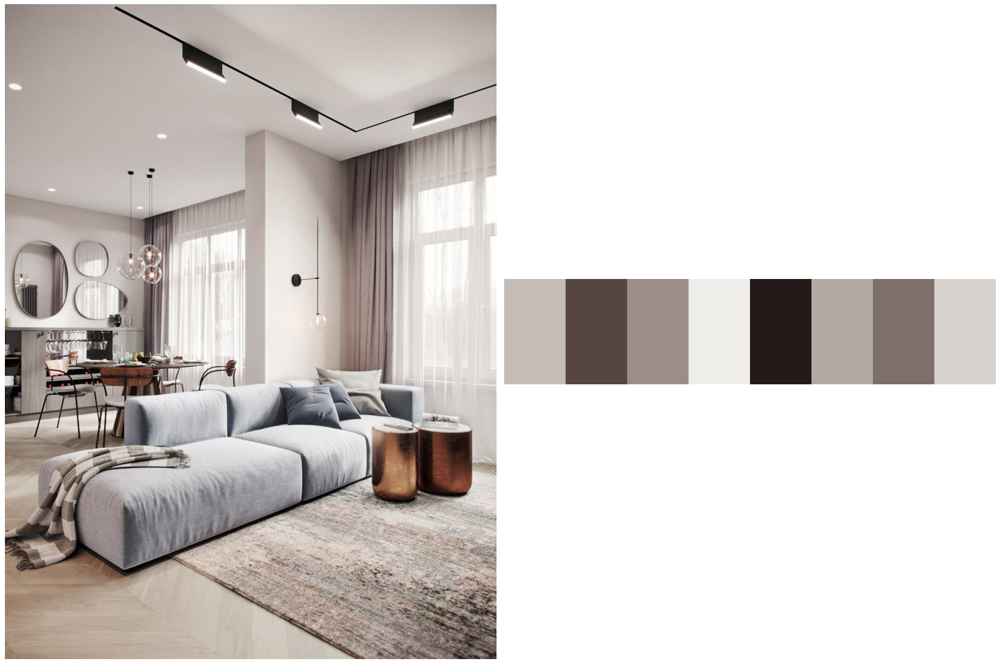

Каменый серый 
Железный 
Белый 
Оловянный 
Коричнево-Бежевый 
Черный 
Серо-Бежевый 
Коамару
['Каменый серый ', 'Железный ', 'Белый ', 'Оловянный ', 'Коричнево-Бежевый ', 'Черный ', 'Серо-Бежевый ', 'Коамару']


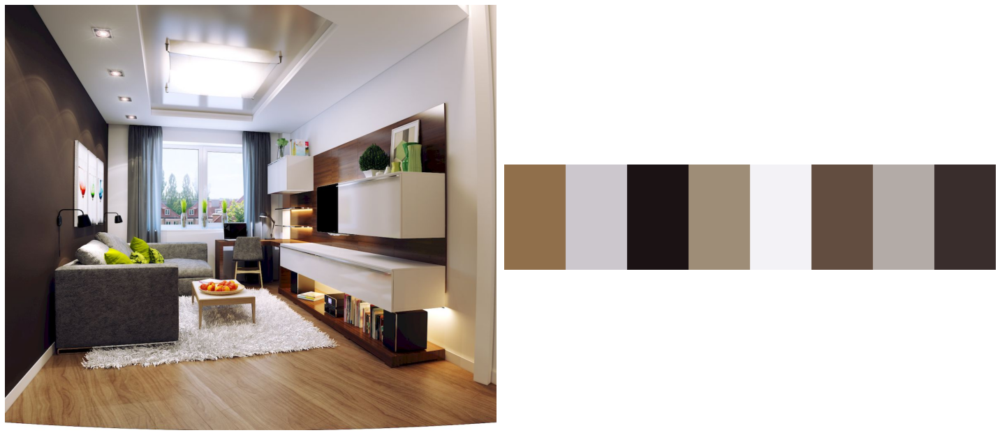

Сандаловый 
Серо-Бежевый 
Каменый серый 
Черный 
Мраморный 
Оловянный 
Железный 
Коричнево-Бежевый 
['Сандаловый ', 'Серо-Бежевый ', 'Каменый серый ', 'Черный ', 'Мраморный ', 'Оловянный ', 'Железный ', 'Коричнево-Бежевый ']


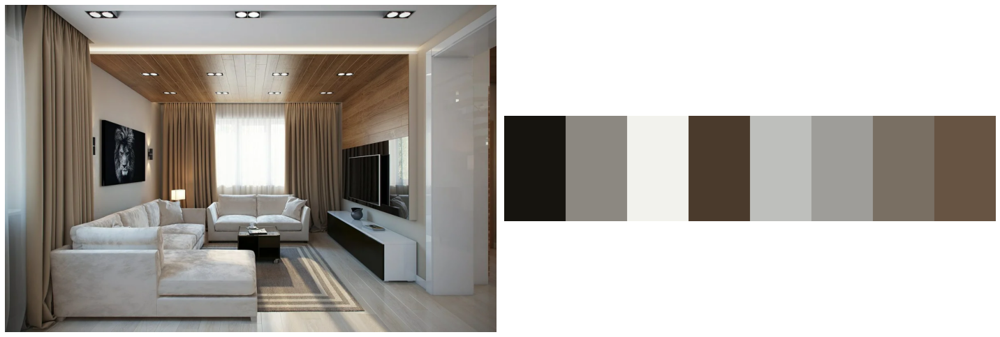

Перламутровый серый 
Железный 
Оловянный 
Коамару
Оловянный 
Железный 
Стальной 
Серо-Бежевый 
['Перламутровый серый ', 'Железный ', 'Оловянный ', 'Коамару', 'Оловянный ', 'Железный ', 'Стальной ', 'Серо-Бежевый ']


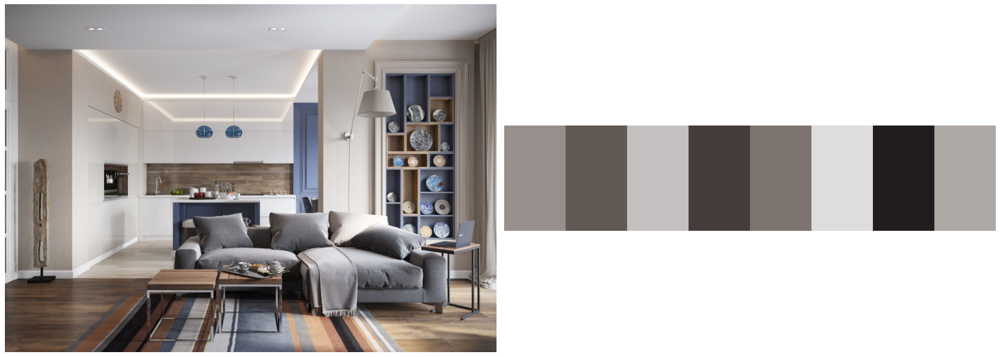

Персиково-бежевый 
Черный 
Коричнево-Бежевый 
Мраморный 
Оловянный 
Железный 
Сиреневый
Стальной 
['Персиково-бежевый ', 'Черный ', 'Коричнево-Бежевый ', 'Мраморный ', 'Оловянный ', 'Железный ', 'Сиреневый', 'Стальной ']


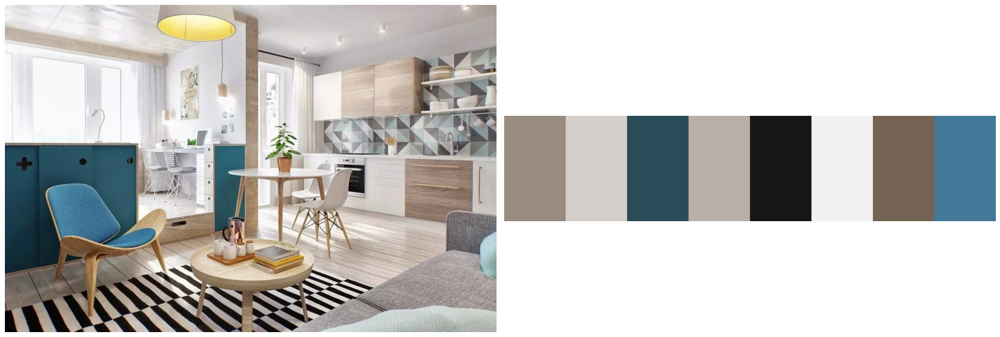

Оловянный 
Морковный 
Мраморный 
Черный 
Умеренно-розовый
Каменый серый 
Красный
Железный 
['Оловянный ', 'Морковный ', 'Мраморный ', 'Черный ', 'Умеренно-розовый', 'Каменый серый ', 'Красный', 'Железный ']


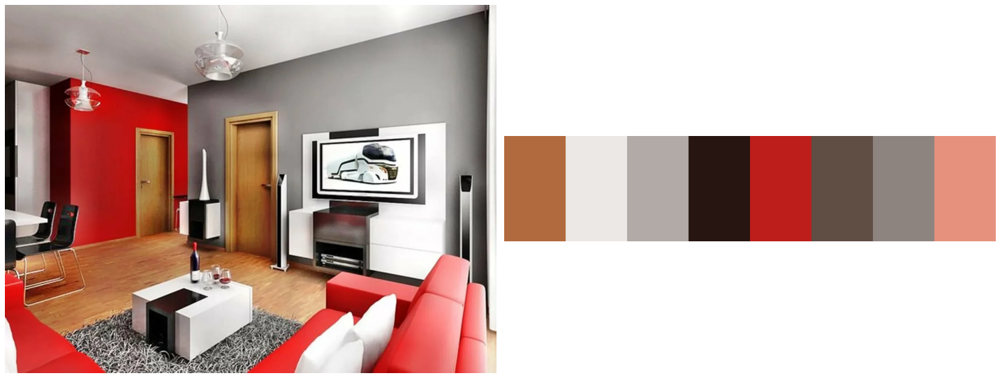

Каменый серый 
Железный 
Перламутровый серый 
Сине-лазурный 
Сандаловый 
Черный 
Аквамариновый 
Оловянный 
['Каменый серый ', 'Железный ', 'Перламутровый серый ', 'Сине-лазурный ', 'Сандаловый ', 'Черный ', 'Аквамариновый ', 'Оловянный ']


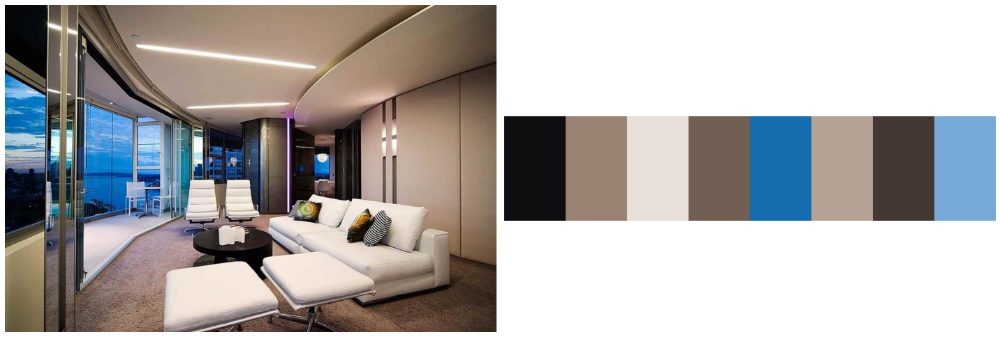

Железный 
Мраморный 
Черный 
Серо-Бежевый 
Коричнево-Бежевый 
Коамару
Оловянный 
Персиково-бежевый 
['Железный ', 'Мраморный ', 'Черный ', 'Серо-Бежевый ', 'Коричнево-Бежевый ', 'Коамару', 'Оловянный ', 'Персиково-бежевый ']


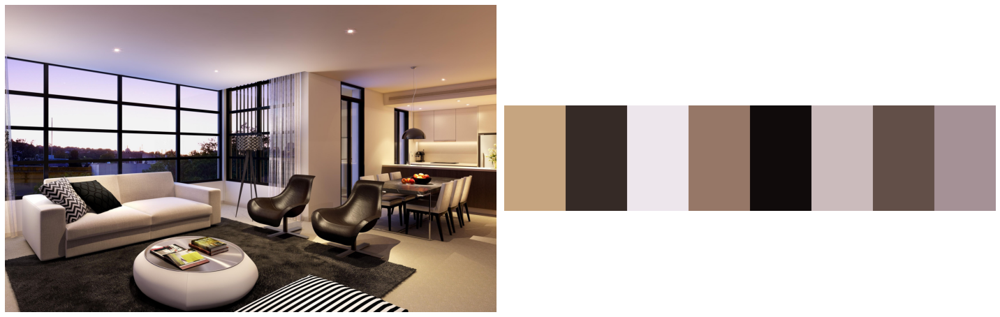

Серо-Бежевый 
Коамару
Коричнево-Бежевый 
Мраморный 
Оловянный 
Черный 
Железный 
Каменый серый 
['Серо-Бежевый ', 'Коамару', 'Коричнево-Бежевый ', 'Мраморный ', 'Оловянный ', 'Черный ', 'Железный ', 'Каменый серый ']


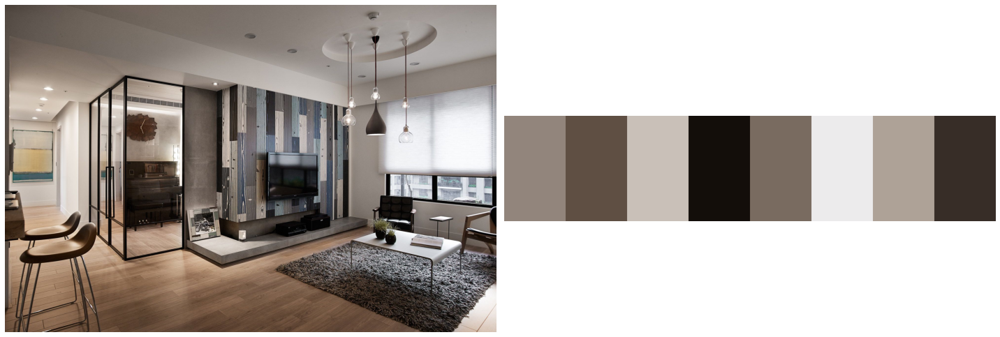

Белый 
Черный 
Стальной 
Серо-Бежевый 
Железный 
Оловянный 
Каменый серый 
Перламутровый серый 
['Белый ', 'Черный ', 'Стальной ', 'Серо-Бежевый ', 'Железный ', 'Оловянный ', 'Каменый серый ', 'Перламутровый серый ']


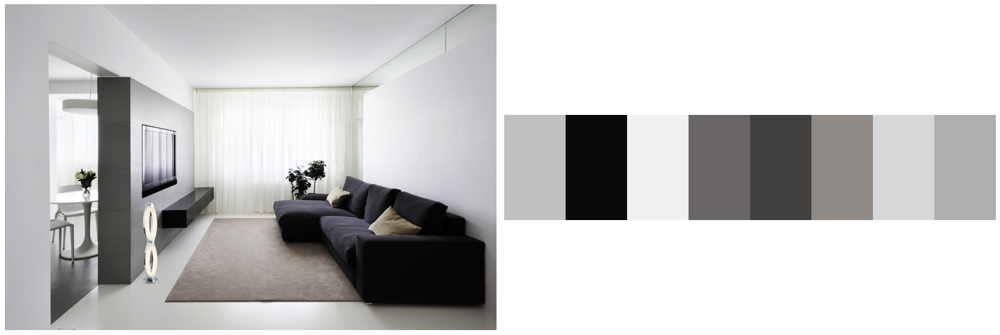

Железный 
Оловянный 
Мраморный 
Железный 
Оловянный 
Серо-Бежевый 
Черный 
Коричнево-Бежевый 
['Железный ', 'Оловянный ', 'Мраморный ', 'Железный ', 'Оловянный ', 'Серо-Бежевый ', 'Черный ', 'Коричнево-Бежевый ']


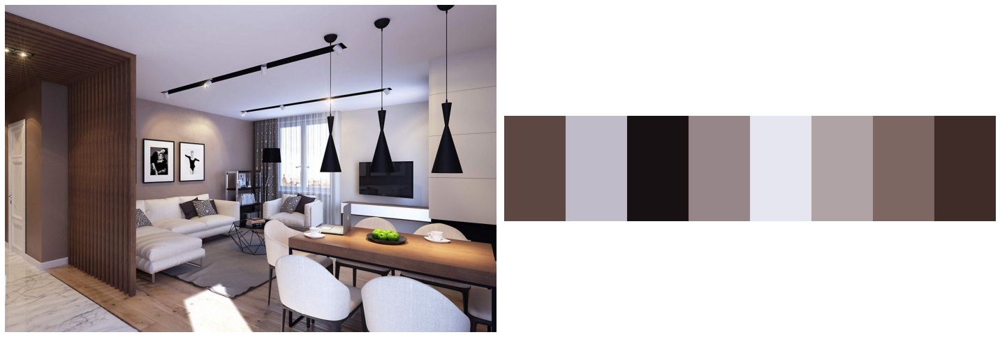

Коричнево-Бежевый 
Серо-Бежевый 
Коамару
Каменый серый 
Мраморный 
Черный 
Оловянный 
Железный 
['Коричнево-Бежевый ', 'Серо-Бежевый ', 'Коамару', 'Каменый серый ', 'Мраморный ', 'Черный ', 'Оловянный ', 'Железный ']


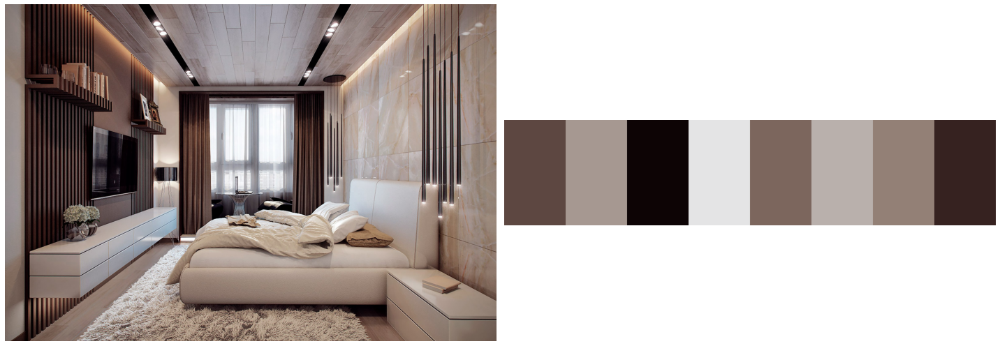

Коричнево-Бежевый 
Железный 
Серо-Бежевый 
Оловянный 
Сандаловый 
Черный 
Миндальный
Светло-абрикосовый
['Коричнево-Бежевый ', 'Железный ', 'Серо-Бежевый ', 'Оловянный ', 'Сандаловый ', 'Черный ', 'Миндальный', 'Светло-абрикосовый']


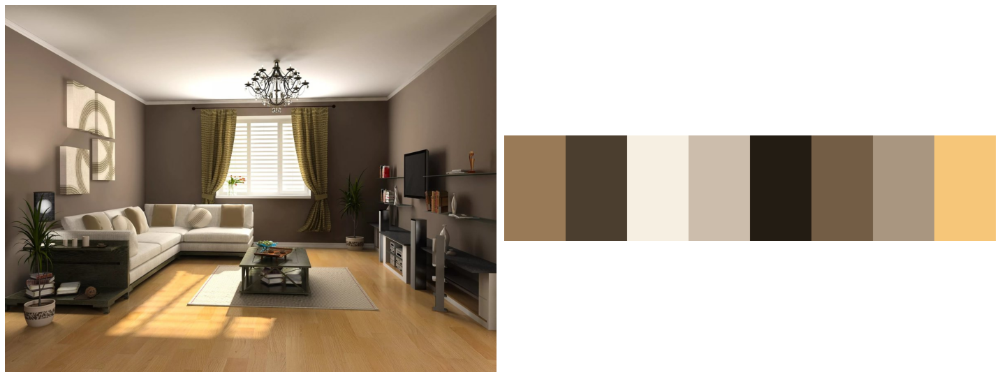

Персиково-бежевый 
Коричнево-Бежевый 
Сандаловый 
Мраморный 
Серо-Бежевый 
Оловянный 
Коричнево-Бежевый 
Коамару
['Персиково-бежевый ', 'Коричнево-Бежевый ', 'Сандаловый ', 'Мраморный ', 'Серо-Бежевый ', 'Оловянный ', 'Коричнево-Бежевый ', 'Коамару']


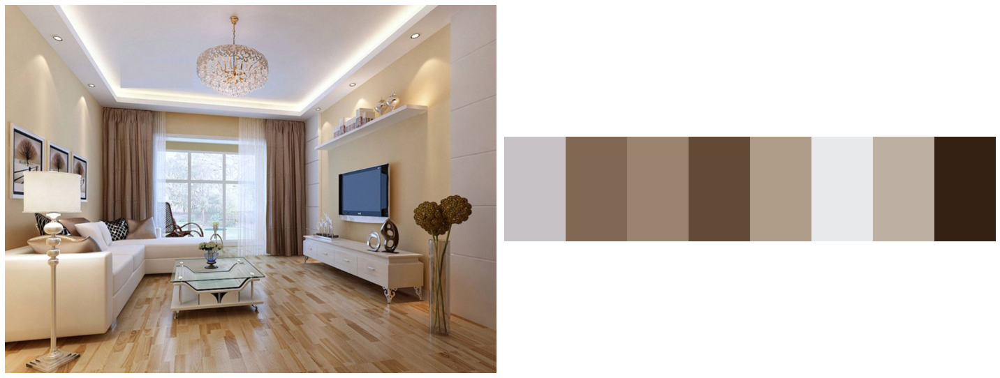

Серо-Бежевый 
Железный 
Оловянный 
Коамару
Мраморный 
Оловянный 
Железный 
Каменый серый 
['Серо-Бежевый ', 'Железный ', 'Оловянный ', 'Коамару', 'Мраморный ', 'Оловянный ', 'Железный ', 'Каменый серый ']


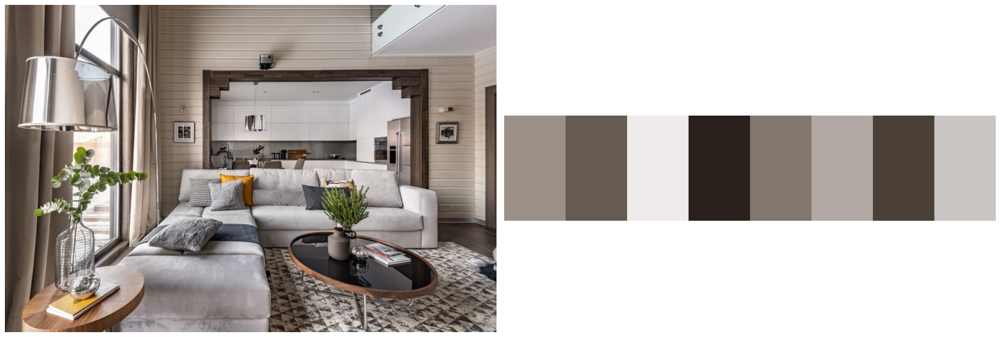

Оловянный 
Железный 
Серо-Бежевый 
Стальной 
Черный 
Мраморный 
Оловянный 
Железный 
['Оловянный ', 'Железный ', 'Серо-Бежевый ', 'Стальной ', 'Черный ', 'Мраморный ', 'Оловянный ', 'Железный ']


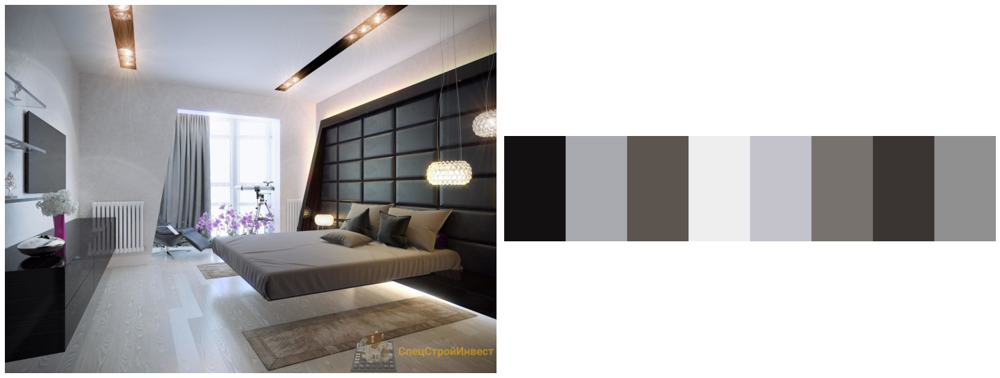

Железный 
Каменый серый 
Персиково-бежевый 
Перламутровый серый 
Коричнево-Бежевый 
Сандаловый 
Оловянный 
Коричнево-Бежевый 
['Железный ', 'Каменый серый ', 'Персиково-бежевый ', 'Перламутровый серый ', 'Коричнево-Бежевый ', 'Сандаловый ', 'Оловянный ', 'Коричнево-Бежевый ']


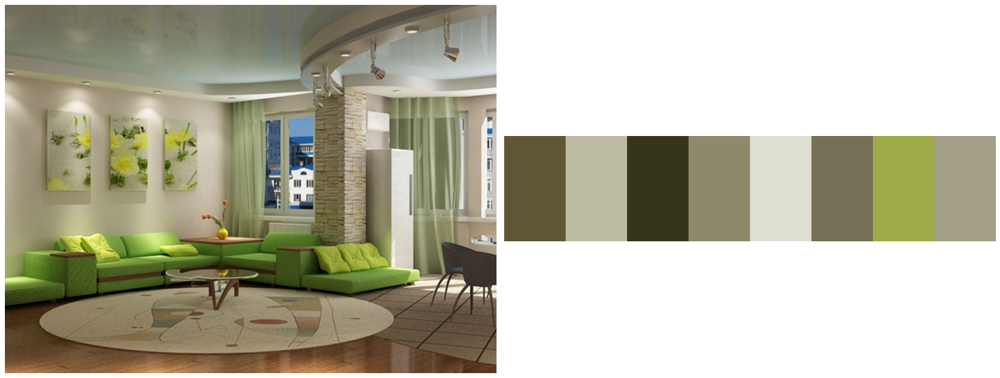

In [11]:
i = int(input())
for i in range(i,200):
  a = 'a' + str(i) + '.jpg'  
  final(a)